In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dhineu-image-caption/image_captions.json
/kaggle/input/dhineu-image-caption/goPro/goPro/G0436766.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0167284.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0587321.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0597336.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0519484.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0083893.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0597340.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0040503.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0394107.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0425946.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0426174.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0497083.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0654519.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0597334.JPG
/kaggle/input/dhineu-image-caption/goPro/goPro/G0363256.JPG
/kaggle/input/dhineu-image-caption/goPro/goPr

In [2]:
import os
import json
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from transformers import BlipProcessor, BlipForConditionalGeneration
import matplotlib.pyplot as plt

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [4]:
# Initialize the BLIP processor
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

In [5]:
class StreetViewDataset(Dataset):
    def __init__(self, annotations_file, img_dir, processor, transform=None):
        with open(annotations_file, 'r') as f:
            self.annotations = json.load(f)
        self.img_dir = img_dir
        self.processor = processor
        self.transform = transform

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        entry = self.annotations[idx]
        image_id = entry["image"]
        caption = entry["captions"][0]
        img_path = os.path.join(self.img_dir, image_id)
        image = Image.open(img_path).convert("RGB")
        
        if self.transform:
            image = self.transform(image)
        
        inputs = self.processor(images=image, text=caption, do_rescale=False, 
                                  return_tensors="pt", padding=True)
        for key in inputs.keys():
            inputs[key] = inputs[key].squeeze(0)
        
        inputs["labels"] = inputs["input_ids"].clone()
        
        return inputs


In [6]:
from torch.nn.utils.rnn import pad_sequence

In [7]:
def custom_collate_fn(batch):
    #input_ids, labels, pixel_values, attention_mask
    input_ids_list   = [item['input_ids'] for item in batch]
    labels_list      = [item['labels'] for item in batch]
    pixel_values_list = [item['pixel_values'] for item in batch]

    if 'attention_mask' in batch[0]:
        attention_mask_list = [item['attention_mask'] for item in batch]
        padded_attention_mask = pad_sequence(
            attention_mask_list, batch_first=True, padding_value=0
        )
    else:
        padded_attention_mask = None

    padded_input_ids = pad_sequence(
        input_ids_list, batch_first=True, padding_value=processor.tokenizer.pad_token_id
    )
    padded_labels = pad_sequence(
        labels_list, batch_first=True, padding_value=processor.tokenizer.pad_token_id
    )

    stacked_pixel_values = torch.stack(pixel_values_list, dim=0)

    collated_batch = {
        "input_ids": padded_input_ids,
        "labels": padded_labels,
        "pixel_values": stacked_pixel_values,
    }
    if padded_attention_mask is not None:
        collated_batch["attention_mask"] = padded_attention_mask
    return collated_batch


In [8]:
transform = transforms.Compose([
    transforms.Resize((384, 384)),
    transforms.ToTensor(),
])

In [9]:
dataset = StreetViewDataset(
    annotations_file="/kaggle/input/dhineu-image-caption/image_captions.json",  
    img_dir="/kaggle/input/dhineu-image-caption/goPro/goPro",
    processor=processor,
    transform=transform
)

In [10]:
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

In [11]:
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=custom_collate_fn)
val_loader = DataLoader(val_dataset, batch_size=4, collate_fn=custom_collate_fn)

In [12]:
for batch in train_loader:
    print("Batch keys:", batch.keys())
    print("input_ids shape:", batch["input_ids"].shape)
    print("pixel_values shape:", batch["pixel_values"].shape)
    if "attention_mask" in batch:
        print("attention_mask shape:", batch["attention_mask"].shape)
    break

Batch keys: dict_keys(['input_ids', 'labels', 'pixel_values', 'attention_mask'])
input_ids shape: torch.Size([4, 12])
pixel_values shape: torch.Size([4, 3, 384, 384])
attention_mask shape: torch.Size([4, 12])


In [13]:
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [14]:
model.to(device)

BlipForConditionalGeneration(
  (vision_model): BlipVisionModel(
    (embeddings): BlipVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (encoder): BlipEncoder(
      (layers): ModuleList(
        (0-11): 12 x BlipEncoderLayer(
          (self_attn): BlipAttention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (projection): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): BlipMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((768,), eps=1e-0

In [15]:
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)

In [16]:
num_epochs = 15

In [17]:
for name, param in model.named_parameters():
    status = "Trainable" if param.requires_grad else "Frozen"
    print(f"{name}: {status}")

vision_model.embeddings.class_embedding: Trainable
vision_model.embeddings.position_embedding: Trainable
vision_model.embeddings.patch_embedding.weight: Trainable
vision_model.embeddings.patch_embedding.bias: Trainable
vision_model.encoder.layers.0.self_attn.qkv.weight: Trainable
vision_model.encoder.layers.0.self_attn.qkv.bias: Trainable
vision_model.encoder.layers.0.self_attn.projection.weight: Trainable
vision_model.encoder.layers.0.self_attn.projection.bias: Trainable
vision_model.encoder.layers.0.layer_norm1.weight: Trainable
vision_model.encoder.layers.0.layer_norm1.bias: Trainable
vision_model.encoder.layers.0.mlp.fc1.weight: Trainable
vision_model.encoder.layers.0.mlp.fc1.bias: Trainable
vision_model.encoder.layers.0.mlp.fc2.weight: Trainable
vision_model.encoder.layers.0.mlp.fc2.bias: Trainable
vision_model.encoder.layers.0.layer_norm2.weight: Trainable
vision_model.encoder.layers.0.layer_norm2.bias: Trainable
vision_model.encoder.layers.1.self_attn.qkv.weight: Trainable
visio

In [ ]:
for name, param in model.named_parameters():
    if name.startswith("vision_model"):
        param.requires_grad = False


In [19]:
for name, param in model.named_parameters():
    status = "Trainable" if param.requires_grad else "Frozen"
    print(f"{name}: {status}")


vision_model.embeddings.class_embedding: Frozen
vision_model.embeddings.position_embedding: Frozen
vision_model.embeddings.patch_embedding.weight: Frozen
vision_model.embeddings.patch_embedding.bias: Frozen
vision_model.encoder.layers.0.self_attn.qkv.weight: Frozen
vision_model.encoder.layers.0.self_attn.qkv.bias: Frozen
vision_model.encoder.layers.0.self_attn.projection.weight: Frozen
vision_model.encoder.layers.0.self_attn.projection.bias: Frozen
vision_model.encoder.layers.0.layer_norm1.weight: Frozen
vision_model.encoder.layers.0.layer_norm1.bias: Frozen
vision_model.encoder.layers.0.mlp.fc1.weight: Frozen
vision_model.encoder.layers.0.mlp.fc1.bias: Frozen
vision_model.encoder.layers.0.mlp.fc2.weight: Frozen
vision_model.encoder.layers.0.mlp.fc2.bias: Frozen
vision_model.encoder.layers.0.layer_norm2.weight: Frozen
vision_model.encoder.layers.0.layer_norm2.bias: Frozen
vision_model.encoder.layers.1.self_attn.qkv.weight: Frozen
vision_model.encoder.layers.1.self_attn.qkv.bias: Frozen

In [ ]:
model.train()
for epoch in range(num_epochs):
    total_loss = 0.0
    for batch in train_loader:
        batch = {key: value.to(device) for key, value in batch.items()}
        
        optimizer.zero_grad()  
        
        # Forward pass
        outputs = model(**batch)
        loss = outputs.loss
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
    
    avg_loss = total_loss / len(train_loader)
    
    model.eval() 
    total_val_loss = 0.0
    with torch.no_grad():
        for batch in val_loader:
            batch = {key: value.to(device) for key, value in batch.items()}
            outputs = model(**batch)
            total_val_loss += outputs.loss.item()
    avg_val_loss = total_val_loss / len(val_loader)
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
    
    model.train()  


Epoch [1/15], Train Loss: 3.3947, Val Loss: 2.6516
Epoch [2/15], Train Loss: 2.2633, Val Loss: 2.2346
Epoch [3/15], Train Loss: 1.4829, Val Loss: 1.6099
Epoch [4/15], Train Loss: 0.7321, Val Loss: 1.2368
Epoch [5/15], Train Loss: 0.3520, Val Loss: 1.0581
Epoch [6/15], Train Loss: 0.1809, Val Loss: 1.0305
Epoch [7/15], Train Loss: 0.1371, Val Loss: 1.1468
Epoch [8/15], Train Loss: 0.1101, Val Loss: 1.0876
Epoch [9/15], Train Loss: 0.0832, Val Loss: 1.1349
Epoch [10/15], Train Loss: 0.0629, Val Loss: 1.1845
Epoch [11/15], Train Loss: 0.0830, Val Loss: 1.1803
Epoch [12/15], Train Loss: 0.0581, Val Loss: 1.2456
Epoch [13/15], Train Loss: 0.0459, Val Loss: 1.2351
Epoch [14/15], Train Loss: 0.0394, Val Loss: 1.3601
Epoch [15/15], Train Loss: 0.0379, Val Loss: 1.3381


In [21]:
def generate_caption(image_path, processor, model, device, transform):

    image = Image.open(image_path).convert("RGB")
    image_transformed = transform(image)
    
    inputs = processor(images=image_transformed, return_tensors="pt", do_rescale=False)
    inputs = {key: value.to(device) for key, value in inputs.items()}
    
    model.eval()
    with torch.no_grad():
        output_ids = model.generate(**inputs, max_length=50)
    
    caption = processor.decode(output_ids[0], skip_special_tokens=True)
    return caption

In [22]:
sample_image_paths = [
    "/kaggle/input/dhineu-image-caption/goPro/goPro/G0302024.JPG",
    "/kaggle/input/dhineu-image-caption/goPro/goPro/G0394874.JPG",
    "/kaggle/input/dhineu-image-caption/goPro/goPro/G0488439.JPG"
]

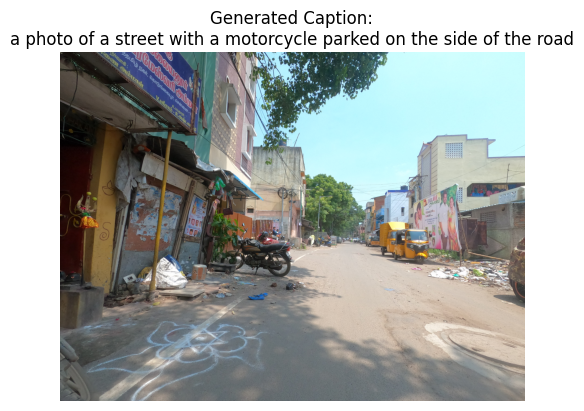

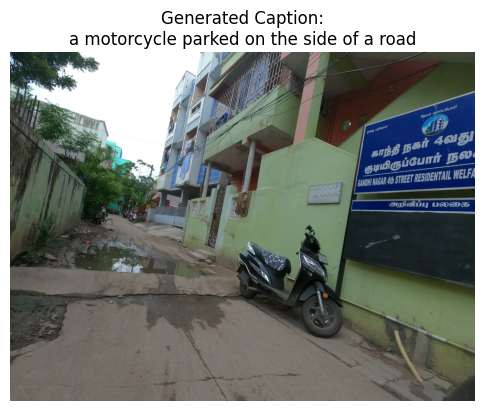

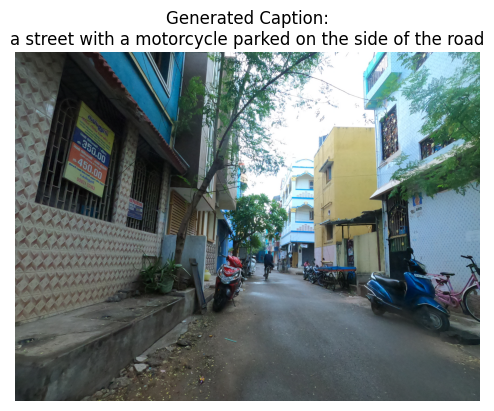

In [23]:
for image_path in sample_image_paths:
    caption = generate_caption(image_path, processor, model, device, transform)
    image = Image.open(image_path).convert("RGB")
    
    plt.figure(figsize=(6,6))
    plt.imshow(image)
    plt.title(f"Generated Caption:\n{caption}")
    plt.axis("off")
    plt.show()

In [24]:
!pip install --upgrade nltk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 25.2 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.4
    Uninstalling nltk-3.2.4:
      Successfully uninstalled nltk-3.2.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
preprocessing 0.1.13 requires nltk==3.2.4, but you have nltk 3.9.1 which is incompatible.


In [25]:
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate.meteor_score import meteor_score

annotations_file = "/kaggle/input/dhineu-image-caption/image_captions.json"
img_dir = "/kaggle/input/dhineu-image-caption/goPro/goPro"

with open(annotations_file, "r") as f:
    annotations = json.load(f)

predictions = []        
references_bleu = []     
references_meteor = []   

for entry in annotations:
    image_path = os.path.join(img_dir, entry["image"])
    gt_caption = entry["captions"][0]  

    generated_caption = generate_caption(image_path, processor, model, device, transform)
    
    tokenized_pred = generated_caption.split()
    tokenized_ref  = gt_caption.split()
    
    predictions.append(tokenized_pred)
    references_bleu.append([tokenized_ref])
    references_meteor.append(tokenized_ref)
    
    print("Image:", entry["image"])
    print("Ground Truth:", gt_caption)
    print("Generated:", generated_caption)
    print("----------")

#BLEU score
bleu = corpus_bleu(references_bleu, predictions)
print("BLEU score:", bleu)

#average METEOR score.
meteor_scores = []
for ref_tokens, pred_tokens in zip(references_meteor, predictions):
    score = meteor_score([ref_tokens], pred_tokens)
    meteor_scores.append(score)

if meteor_scores:
    avg_meteor = sum(meteor_scores) / len(meteor_scores)
    print("Average METEOR score:", avg_meteor)
else:
    print("No METEOR scores computed; check that your references and predictions are populated.")


Image: G0302024.JPG
Ground Truth: a photo of a street with a motorcycle parked on the side of the road
Generated: a photo of a street with a motorcycle parked on the side of the road
----------
Image: G0394874.JPG
Ground Truth: a motorcycle parked on the side of a road
Generated: a motorcycle parked on the side of a road
----------
Image: G0488439.JPG
Ground Truth: a street in a small town with motorcycle parked on both side of the road
Generated: a street with a motorcycle parked on the side of the road
----------
Image: G0093962.JPG
Ground Truth: a view of a street in a small town
Generated: a view of a street in a small town
----------
Image: G0497104.JPG
Ground Truth: a street with car on the road and motorcycles parked  on the side
Generated: a street with car on the road and motorcycles parked on the side
----------
Image: G0497103.JPG
Ground Truth: a photo of a street with cars parked on the side of the road
Generated: a white car parked on the side of the road
----------
Image:

In [26]:
!pip install git+https://github.com/salaniz/pycocoevalcap.git

  Cloning https://github.com/salaniz/pycocoevalcap.git to /tmp/pip-req-build-1qwtqldi
  Running command git clone --filter=blob:none --quiet https://github.com/salaniz/pycocoevalcap.git /tmp/pip-req-build-1qwtqldi
  Resolved https://github.com/salaniz/pycocoevalcap.git to commit a24f74c408c918f1f4ec34e9514bc8a76ce41ffd
  Preparing metadata (setup.py) ... done
  Created wheel for pycocoevalcap: filename=pycocoevalcap-1.2-py3-none-any.whl size=104312245 sha256=e3ed03827111dfdeab973abc0ca31d9fd57a98fc6482e295d1bc550ebeb8bc69
  Stored in directory: /tmp/pip-ephem-wheel-cache-sb87ouq_/wheels/57/de/9f/7aa9ae75f4e4733cc4b66b5c3a65a05de62a28e8111649fee5
Successfully built pycocoevalcap


In [28]:
from pycocoevalcap.cider.cider import Cider

refs_dict = {}
hyps_dict = {}
for entry in annotations:
    image_id = entry["image"]
    gt_caption = entry["captions"][0]
    image_path = os.path.join("/kaggle/input/dhineu-image-caption/goPro/goPro", image_id)
    generated_caption = generate_caption(image_path, processor, model, device, transform)
    refs_dict[image_id] = [gt_caption]
    hyps_dict[image_id] = [generated_caption]  

cider_scorer = Cider()
cidervalue, _ = cider_scorer.compute_score(refs_dict, hyps_dict)
print("CIDEr score:", cidervalue)


CIDEr score: 7.808379616594618


In [29]:
save_dir = "/kaggle/working/blip_caption_model"
os.makedirs(save_dir, exist_ok=True)
model.save_pretrained(save_dir)
processor.save_pretrained(save_dir)
print(f"Model and processor saved to {save_dir}")

Model and processor saved to /kaggle/working/blip_caption_model


In [30]:
!zip -r /kaggle/working/blip_caption_model.zip /kaggle/working/blip_caption_model

  adding: kaggle/working/blip_caption_model/ (stored 0%)
  adding: kaggle/working/blip_caption_model/special_tokens_map.json (deflated 80%)
  adding: kaggle/working/blip_caption_model/tokenizer.json (deflated 71%)
  adding: kaggle/working/blip_caption_model/tokenizer_config.json (deflated 74%)
  adding: kaggle/working/blip_caption_model/model.safetensors (deflated 7%)
  adding: kaggle/working/blip_caption_model/generation_config.json (deflated 26%)
  adding: kaggle/working/blip_caption_model/preprocessor_config.json (deflated 48%)
  adding: kaggle/working/blip_caption_model/config.json (deflated 54%)
  adding: kaggle/working/blip_caption_model/vocab.txt (deflated 53%)


In [31]:
from IPython.display import FileLink

In [32]:
FileLink('blip_caption_model.zip')

/kaggle/working/blip_caption_model.zip

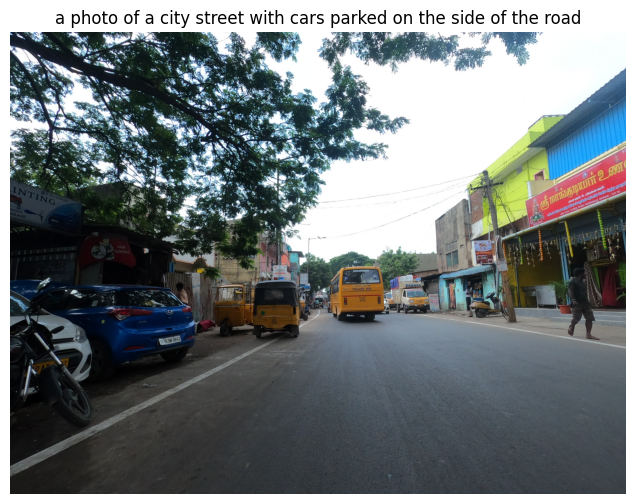

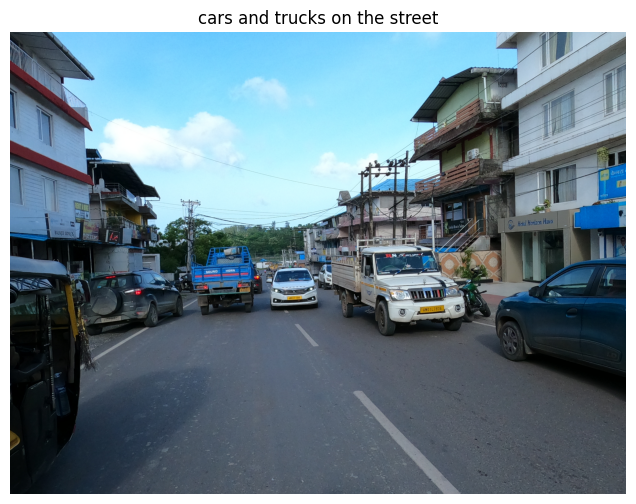

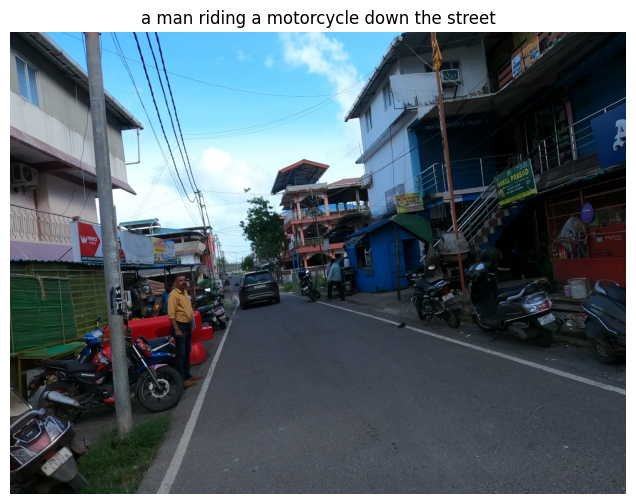

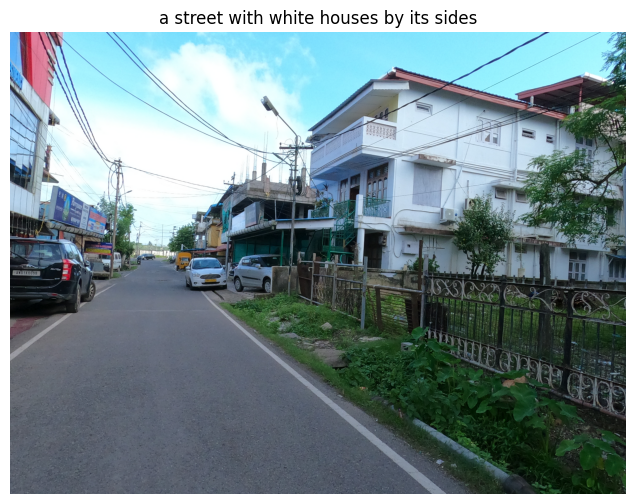

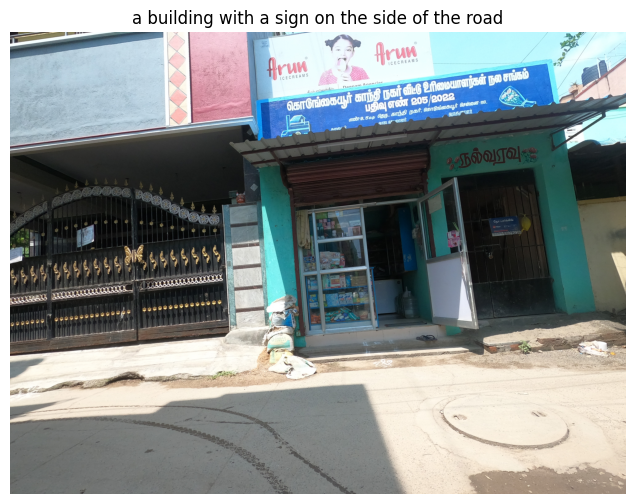

...

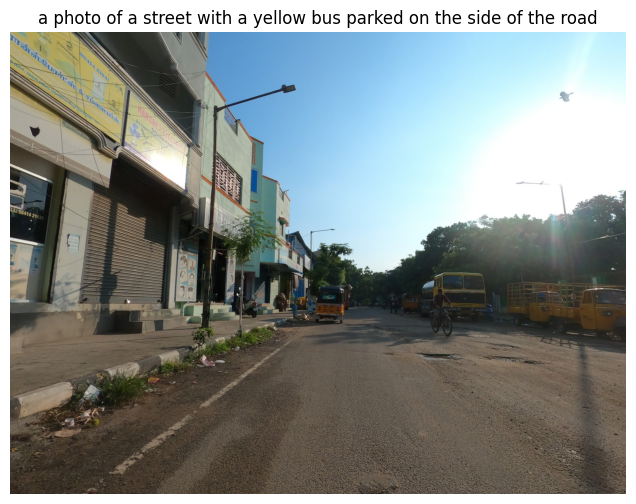

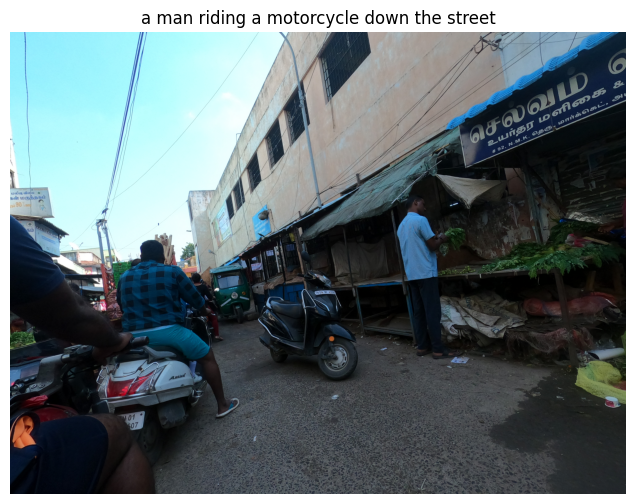

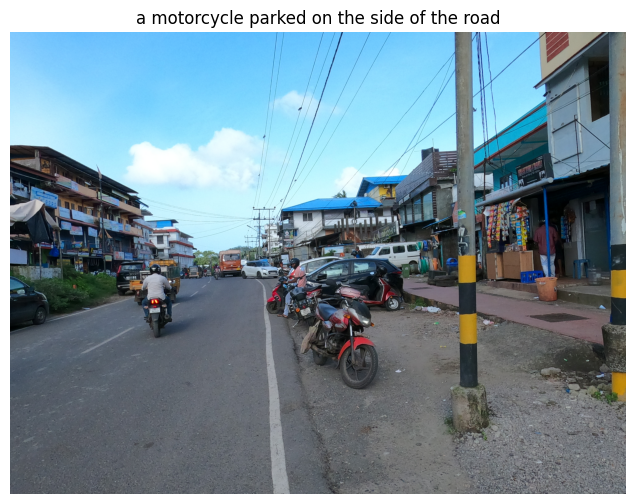

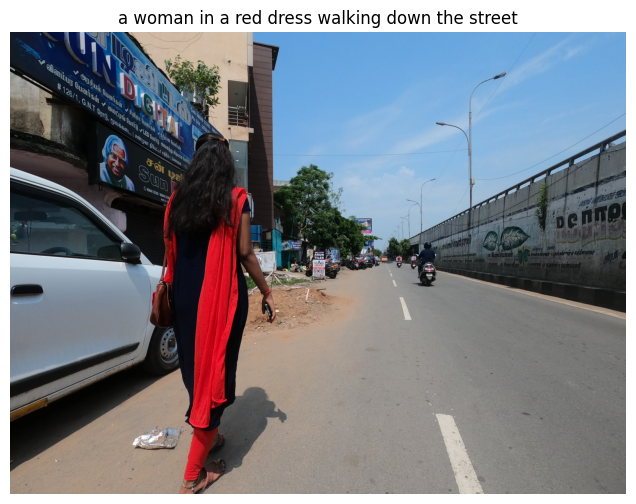

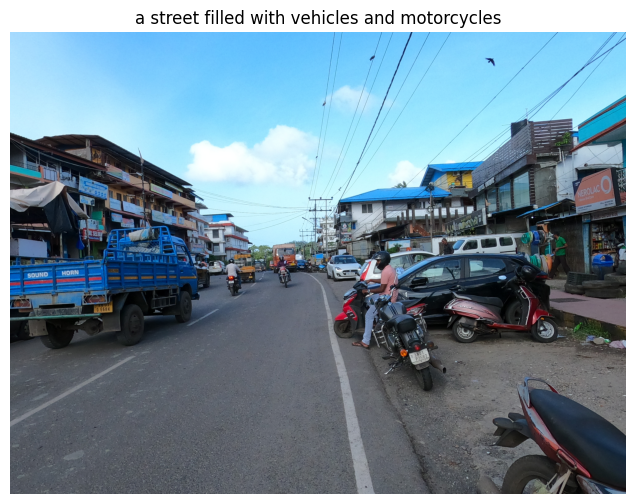

In [33]:
import matplotlib.pyplot as plt
from PIL import Image
import os

for idx in val_dataset.indices:
    entry = dataset.annotations[idx]
    image_filename = entry["image"]
    image_path = os.path.join(dataset.img_dir, image_filename)

    generated_caption = generate_caption(image_path, processor, model, device, transform)
    
    image = Image.open(image_path).convert("RGB")
    
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(generated_caption)
    plt.axis("off")
    plt.show()
